#Natural Language Processing, 2023/24

**Team**: Irene CARIDI, Matteo FARINA, Carlo LAZZARI, Matteo MISSANA, Valeria MUCCIO

**Group Assignment**: Medical Meadow Medical Flashcards dataset

**Description**: Information on medical curriculum flashcards has been given to GPT-3.5 and used to create medical knowledge question answer pairs

**Task**: Medical Question Answering (i.e. train a model to answer medical questions)

# Preliminary analysis
In the first part, we briefly describe the dataset, pointing out some information about the document and some simple statistics regarding the dataset.

## Document
### What type of documents does it contain?
Medical meadow medical flashcards is a dataset containing questions and answers about medicine and all subjects that cover the curriculum of medical students. These flashcards contain only text and are created through OpenAI's GPT-3.5-turbo that reformulates the cards into coherent and contextually relevant question-answer pairs. Typically, the questions and answers are short and direct.

### How many documents are there?
The dataset are composed by 33955 dictionaries, collected in a list, where the keys are: instruction, input, output. The instruction is always "Answer this question truthfully".

In [ ]:
# Import library used
from google.colab import drive
import os
import json
import matplotlib.pyplot as plt
import numpy as np
import string
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
import math

#Download packages
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
#Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Set up the directory
path = 'Colab Notebooks/progetto_nlp'
#path = 'NLP/progetto_nlp'

os.chdir(f'/content/drive/MyDrive/{path}')
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1sxUl1m-JeFL973pzRXJxbv7u49Ot5KHx/progetto_nlp'

In [ ]:
#Clone the dataset medAlpaca
#!git clone https://github.com/kbressem/medalpaca

In [ ]:
#Install Python packages
#%pip install -r '/content/drive/MyDrive/Colab Notebooks/nlp_project/medalpaca/requirements.txt'

In [ ]:
#Load dataset
data_path = 'medical_meadow_wikidoc_medical_flashcards.json'

with open(data_path) as f:
    dataset = [json.loads(line) for line in f]

#From list to dictionary
dataset = dataset[0]

#Display the first five elements
dataset[:5]

[{'instruction': 'Answer this question truthfully',
  'input': 'What is the relationship between very low Mg2+ levels, PTH levels, and Ca2+ levels?',
  'output': 'Very low Mg2+ levels correspond to low PTH levels which in turn results in low Ca2+ levels.'},
 {'instruction': 'Answer this question truthfully',
  'input': 'What leads to genitourinary syndrome of menopause (atrophic vaginitis)?',
  'output': 'Low estradiol production leads to genitourinary syndrome of menopause (atrophic vaginitis).'},
 {'instruction': 'Answer this question truthfully',
  'input': 'What does low REM sleep latency and experiencing hallucinations/sleep paralysis suggest?',
  'output': 'Low REM sleep latency and experiencing hallucinations/sleep paralysis suggests narcolepsy.'},
 {'instruction': 'Answer this question truthfully',
  'input': 'What are some possible causes of low PTH and high calcium levels?',
  'output': 'PTH-independent hypercalcemia, which can be caused by cancer, granulomatous disease, or v

## Simple statistics
In this cell, we calculated some simple statistical indexes:
* Dataset length
* Average length of sentences: divided in input and output
* Words frequency
* Average number of words per senteces: divided in input and output
* Vocabulary size


In [ ]:
# Visualize some information
print('The keys of the dictionary are:', dataset[0].keys())
print('The length of the dataset is', len(dataset))

The keys of the dictionary are: dict_keys(['instruction', 'input', 'output'])
The length of the dataset is 33955


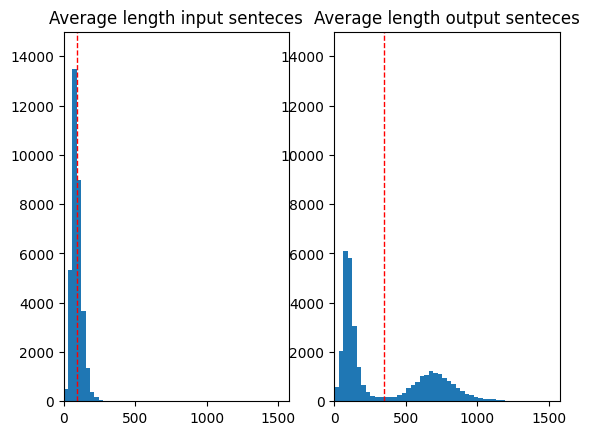

In [ ]:
# Average length of input and output sentences
length_in = [len(line["input"]) for line in dataset]
length_out = [len(line["output"]) for line in dataset]

# Calculate means
mean_length_in = np.mean(length_in)
mean_length_out = np.mean(length_out)
num_bins_out = 50
num_bins_in =math.ceil((max(length_in)/max(length_out))*num_bins_out)

fig, axs = plt.subplots(1, 2)
axs[0].hist(length_in,bins=num_bins_in )
axs[0].axvline(mean_length_in, color='r', linestyle='dashed', linewidth=1)
axs[0].set_title('Average length input senteces')
axs[0].set_xlim(0,max(length_out))
axs[0].set_ylim(0,15000)


axs[1].hist(length_out,bins=num_bins_out)
axs[1].axvline(mean_length_out, color='r', linestyle='dashed', linewidth=1)
axs[1].set_title('Average length output senteces')
axs[1].set_xlim(0,max(length_out))
axs[1].set_ylim(0,15000)

plt.show()

The total mean of the output sentences is higher than the total mean of the input sentences.
Furthermore, the input sentences are more uniform in length and the distribution seems to be able to be approximated as a Gaussian distribution, whereas the output sentences have two distinct peaks: the first between 0 and 150, the second between 650 and 800.

In [ ]:
# Join all dataset into a string
text = [line['input'] + line['output'] for line in dataset]
all_text = ' '.join([entry for entry in text])
all_text

'What is the relationship between very low Mg2+ levels, PTH levels, and Ca2+ levels?Very low Mg2+ levels correspond to low PTH levels which in turn results in low Ca2+ levels. What leads to genitourinary syndrome of menopause (atrophic vaginitis)?Low estradiol production leads to genitourinary syndrome of menopause (atrophic vaginitis). What does low REM sleep latency and experiencing hallucinations/sleep paralysis suggest?Low REM sleep latency and experiencing hallucinations/sleep paralysis suggests narcolepsy. What are some possible causes of low PTH and high calcium levels?PTH-independent hypercalcemia, which can be caused by cancer, granulomatous disease, or vitamin D intoxication. How does the level of anti-müllerian hormone relate to ovarian reserve?The level of anti-müllerian hormone is directly related to ovarian reserve - a lower level indicates a lower ovarian reserve. What does low Mobility and bulging of TM suggest?Low Mobility and bulging of TM is suggestive of Acute otiti

In [ ]:
# Tokenize all dataset
words = word_tokenize(all_text)
words = [w.lower() for w in words]

# Remove stopwords
words_nostopwords = [w for w in words if w not in stopwords.words('english')]

# Remove 5W words
words_no5w = [w for w in words_nostopwords if w not in ['what', 'where', 'who', 'why', 'when', 'how', 'which']]

# Remove punctuation
words_clean = [w for w in words_no5w if w not in string.punctuation]

# Divide words eliminating punctuation
words_split = [subword for word in words_clean for subword in re.split(r'\W+', word) if subword]

# Most frequent words
counts_words = nltk.Counter(words_split)
print(counts_words)

Counter({'may': 12695, 'treatment': 10228, 'symptoms': 9797, 'cause': 9585, 'blood': 9372, 'type': 7877, 'condition': 7547, 'cells': 7117, 'used': 7082, 'associated': 6515, 'disease': 6333, 'typically': 5871, 'important': 5753, 'patients': 5523, 'risk': 5065, 's': 4979, 'body': 4809, 'syndrome': 4694, 'lead': 4592, 'infection': 4478, 'patient': 4349, 'levels': 4293, 'include': 4271, 'cell': 4251, 'also': 4248, 'common': 4204, 'commonly': 3853, 'pain': 3841, 'cancer': 3837, 'caused': 3809, 'heart': 3654, 'characterized': 3640, 'including': 3632, 'medical': 3572, 'recommended': 3431, 'cases': 3287, 'medications': 3172, 'diagnosis': 3114, 'help': 3089, 'complications': 3079, 'increased': 2986, 'prevent': 2834, 'one': 2805, 'disorder': 2741, 'potential': 2703, 'involves': 2682, 'occur': 2658, 'infections': 2635, 'due': 2608, 'individuals': 2592, 'pressure': 2592, 'factors': 2580, 'result': 2442, 'medication': 2440, 'known': 2436, 'muscle': 2411, 'damage': 2404, 'causes': 2393, 'conditions'

To display the most frequent words, we remove the 5Ws and stopwords because they are very frequent and do not give additional information to the text.
With the exception of the first word, the others are all generic words related to medical fields.

Text(0.5, 1.0, 'Average number of characters for words')

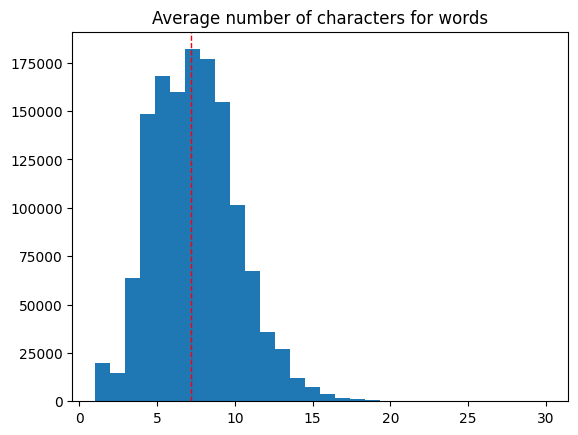

In [ ]:
length = [len(w) for w in words_split]

avg_length = np.mean(length)

plt.hist(length, bins = 30)
plt.axvline(avg_length, color='r', linestyle='dashed', linewidth=1)
plt.title('Average number of characters for word')

In this graph, we considered all togheter the input and output words because we suppose that the words are similar.

The distribution seems to be gaussian with a mean around 7.

In [ ]:
# Vocabulary size
words_nopunctuation = [w for w in words if w not in string.punctuation]
vocabulary = set(words_nopunctuation)
vocab = len(vocabulary)
n_words = len(words_nopunctuation)
print('The total number of words in the dataset is', n_words)
print('The vocabulary size is', vocab)

# Number of unique words in the dataset
num_unique_words = len(counts_words)
print('The dimension of the vocabulary, considering just unique words, is', num_unique_words)

The total number of words in the dataset is 2318973
The vocabulary size is 27117
The dimension of the vocabulary, considering just unique words, is 22821


## Clustering

In this section, we apply some custering methods, like K-means and LDA.

In [ ]:
# Import library used in this cell
from sklearn.feature_extraction.text import TfidfVectorizer
import random
import joblib
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pickle
from sklearn.cluster import MiniBatchKMeans
from sklearn.decomposition import TruncatedSVD
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation


In order to procede with the clustering, since we will use a bag of words representation, we need to put together the "input" and "output" string for each of the questions.

In [ ]:
documents = [f"{sample['input']} {sample['output']}" for sample in dataset]

documents[:10]

['What is the relationship between very low Mg2+ levels, PTH levels, and Ca2+ levels? Very low Mg2+ levels correspond to low PTH levels which in turn results in low Ca2+ levels.',
 'What leads to genitourinary syndrome of menopause (atrophic vaginitis)? Low estradiol production leads to genitourinary syndrome of menopause (atrophic vaginitis).',
 'What does low REM sleep latency and experiencing hallucinations/sleep paralysis suggest? Low REM sleep latency and experiencing hallucinations/sleep paralysis suggests narcolepsy.',
 'What are some possible causes of low PTH and high calcium levels? PTH-independent hypercalcemia, which can be caused by cancer, granulomatous disease, or vitamin D intoxication.',
 'How does the level of anti-müllerian hormone relate to ovarian reserve? The level of anti-müllerian hormone is directly related to ovarian reserve - a lower level indicates a lower ovarian reserve.',
 'What does low Mobility and bulging of TM suggest? Low Mobility and bulging of TM i

Next, we need to vectorize the documents in order to apply the clustering algorithms. Then we visualize simple statistics about the fitted vectorizer.

In [ ]:
# Define vectorizer
vectorizer = TfidfVectorizer(max_df=0.8, min_df=5, stop_words='english')
vectorizer.fit(documents)

TfidfVectorizer(max_df=0.8, min_df=5, stop_words='english')

In [ ]:
vocab = vectorizer.get_feature_names_out()

print(f"The length of the vocabulary is: {len(vocab)}")

The length of the vocabulary is: 10953


In [ ]:
# Visualize 10 random words in the vocabulary
sorted(random.sample(vocab.tolist(),10))

['biophysical',
 'competitively',
 'contribute',
 'copd',
 'feel',
 'heartbeats',
 'imbalance',
 'sandflies',
 'statins',
 'terror']

In [ ]:
# Save the vectorizer object
joblib.dump(vectorizer, 'tfidvectorizer.pkl')

['tfidvectorizer.pkl']

In [ ]:
# Load the vectorizer object from the file
vectorizer = joblib.load('tfidvectorizer.pkl')

In [ ]:
# Vectorize the document
vector_documents = vectorizer.transform(documents)

  (0, 10312)	0.1617692887172406
  (0, 8592)	0.12445740995573418
  (0, 8436)	0.13256350298957784
  (0, 8117)	0.3345025963045528
  (0, 6278)	0.4054796777182482
  (0, 5879)	0.4395371474309907
  (0, 5739)	0.5614433004950891
  (0, 2292)	0.2321514464966158
  (0, 1428)	0.31961920198905


### K-means clustering
One method we apply is k-means method. We use it for assigning the documents to a cluster.

After some tryals, we choose k=100, which seems to lead to good results.

In [ ]:
# Define number of clusters
k = 100

# Initialize and fit KMeans clustering
kmeans = KMeans(n_clusters=k, max_iter=100, n_init=2, verbose=True, random_state=42)
kmeans.fit(vector_documents)

Initialization complete
Iteration 0, inertia 56575.47940608904.
Iteration 1, inertia 31344.64561988213.
Iteration 2, inertia 30944.483889513664.
Iteration 3, inertia 30783.657983194487.
Iteration 4, inertia 30701.330534588193.
Iteration 5, inertia 30656.586294627115.
Iteration 6, inertia 30626.546877734443.
Iteration 7, inertia 30610.97751538104.
Iteration 8, inertia 30601.32442518561.
Iteration 9, inertia 30591.91812676701.
Iteration 10, inertia 30582.98572148443.
Iteration 11, inertia 30575.561321321667.
Iteration 12, inertia 30569.42254584866.
Iteration 13, inertia 30564.935890776316.
Iteration 14, inertia 30558.920899698824.
Iteration 15, inertia 30552.914327075363.
Iteration 16, inertia 30548.616968091814.
Iteration 17, inertia 30544.533298077982.
Iteration 18, inertia 30542.200421619193.
Iteration 19, inertia 30541.016038016503.
Iteration 20, inertia 30538.748852647383.
Iteration 21, inertia 30536.578347416013.
Iteration 22, inertia 30536.27212622229.
Iteration 23, inertia 30535.

KMeans(max_iter=100, n_clusters=100, n_init=2, random_state=42, verbose=True)

In [ ]:
# Save kmeans model
joblib.dump(kmeans, 'kmeans_model.pkl')

['kmeans_model.pkl']

In [ ]:
# Load the model from the file
kmeans = joblib.load('kmeans_model.pkl')

Now, we print the 30 most representative terms for each cluster.

In [ ]:
print("Top terms per cluster:")
vocab = vectorizer.get_feature_names_out()

for i in range(kmeans.n_clusters):
    centroid = kmeans.cluster_centers_[i]
    sorted_terms = centroid.argsort()[::-1]
    print(f"Cluster {i}:\t{[vocab[j] for j in sorted_terms[:30]]}")

Top terms per cluster:
Cluster 0:	['travels', 'popliteal', 'artery', 'fossa', 'posterior', 'knee', 'nerve', 'humerus', 'pilocytic', 'astrocytomas', 'cyst', 'dislocation', 'brain', 'brachial', 'peripheral', 'lateral', 'extremity', 'pathway', 'superficial', 'tibial', 'iliac', 'injured', 'humeral', 'lymphatic', 'cerebellum', 'blood', 'medial', 'circumflex', 'vascular', 'nodes']
Cluster 1:	['associated', 'type', 'cause', 'patients', 'does', 'commonly', 'typically', 'common', 'treatment', 'characterized', 'condition', 'body', 'causes', 'caused', 'known', 'form', 'potential', 'present', 'primary', 'effect', 'brain', 'occur', 'result', 'patient', 'development', 'effects', 'used', 'typical', 'increased', 'responsible']
Cluster 2:	['pleural', 'effusion', 'exudative', 'parapneumonic', 'fluid', 'transudative', 'effusions', 'space', 'chest', 'ph', 'characterized', 'empyema', 'glucose', 'complicated', 'ldh', 'type', 'lymphatic', 'uncomplicated', 'dl', 'medical', 'pericardial', 'breath', 'patient', 

Using chatGPT, we try to assign to each cluster a label, and see if it makes sense.

In [ ]:
# Labels named using chatGPT
labels_kmeans = [
    "Orthopedic Medicine",
    "Disease Characteristics",
    "Pulmonary Medicine",
    "Endocrine Disorders",
    "Urology",
    "Cardiology",
    "Pharmacology",
    "Immunology",
    "Hematology",
    "Diagnostics",
    "Neurology",
    "Infectious Diseases",
    "Oncology",
    "Rheumatology",
    "Nephrology",
    "Neurology",
    "Endocrinology",
    "Oncology",
    "Pharmacology",
    "Syndromes",
    "Microbiology",
    "Hematology",
    "Risk Factors",
    "Clinical Chemistry",
    "Obstetrics/Gynecology",
    "Surgery",
    "Nephrology",
    "Cardiology",
    "Cell Biology",
    "Cardiology",
    "Cardiology",
    "Substance Use Disorders",
    "Endocrinology",
    "Biochemistry",
    "Neurology",
    "Pulmonary Medicine",
    "Ophthalmology",
    "Treatment Modalities",
    "Miscellaneous Medical Conditions",
    "Pharmacology",
    "Acid-Base Disorders",
    "Molecular Biology",
    "Psychiatry",
    "Immunology",
    "Cardiology",
    "Cardiology",
    "Pediatrics",
    "Pharmacology",
    "Immunology",
    "Infectious Diseases",
    "Hepatology",
    "Physiology",
    "Lymphoid Malignancies",
    "Neonatal Infections",
    "Diabetes Mellitus",
    "Ear Disorders",
    "Fluid and Electrolyte Balance",
    "Peripheral Nervous System Disorders",
    "Metabolic Disorders",
    "Pulmonary Infections",
    "Bone Disorders",
    "Adverse Effects of Medications",
    "Bacterial Pathogenesis",
    "Breast Conditions",
    "Tumor Types",
    "Lymphatic System Disorders",
    "Parathyroid Disorders",
    "Bacterial Infections and Antibiotic Resistance",
    "Various Diseases",
    "Renal Disorders",
    "Congenital Infections and Abnormalities",
    "Pancreatic and Biliary Disorders",
    "Viral Infections",
    "Receptor Physiology",
    "Pregnancy Complications",
    "Bone Fractures",
    "General Medical Conditions",
    "Physiological Processes",
    "HIV/AIDS",
    "Pulmonary Diseases",
    "Hematological Disorders",
    "Gastrointestinal Disorders",
    "Mnemonics and Acronyms",
    "Dermatological Conditions",
    "Vitamin Deficiencies",
    "Obstetric Conditions",
    "Neurological Degenerative Diseases",
    "Genetic Processes",
    "Health Screenings",
    "Treatment Modalities",
    "Pulmonary Vascular Diseases",
    "Cystic and Infectious Diseases",
    "Neurotransmitter Receptors",
    "Diuretic Pharmacology",
    "Viral Genetics",
    "Pharmacological Classes",
    "Drug Side Effects",
    "Cardiac Electrophysiology",
    "Diagnostic Scenarios",
    "Esophageal Disorders"
]

Obviously, neither the clustering nor the labeling is perfect. We see that many labels are repeated for different clusters with similar content.

We now try and print the 10 most related documents for a cluster, and see if they are related with the assigned labeling.

In [ ]:
# Choose a cluster
n_cluster = 4

# Get the centroid for the first cluster
centroid = kmeans.cluster_centers_[n_cluster]

# Calculate dot products of centroid with all documents
similarities = [np.dot(centroid, vec) for vec in vector_documents.toarray()]

# Get indices of documents sorted by similarity (in descending order)
sorted_indices = np.argsort(similarities)[::-1]

# Print the label for this cluster
print('generated cluster label:',labels_kmeans[n_cluster])

# Print the first 10 documents that are most similar to the centroid
for i in range(10):
    index = sorted_indices[i]
    print(documents[index])

generated cluster label: Urology
What is overflow incontinence, and how is it characterized? Overflow incontinence is a type of urinary incontinence that occurs when the bladder becomes so full that it overflows, resulting in involuntary leakage of urine. This condition is characterized by leakage with overfilling of the bladder, which can happen when the bladder is unable to empty completely due to a blockage or weakened bladder muscle. Symptoms of overflow incontinence may include frequent urination, difficulty starting urination, weak urine stream, and the sensation of incomplete bladder emptying. This condition can be caused by a variety of factors, including nerve damage, certain medications, an enlarged prostate gland in men, pelvic organ prolapse in women, or bladder or urethral stones. Treatment for overflow incontinence typically involves addressing the underlying cause of the condition, such as medication adjustments or surgery to remove a blockage.
What is overflow incontine

The Q/As associated with urology make sense, in particular these 10 documents are related to incontinence, a special condition regarding urology field.

Now we print the number of assigned documents for each cluster

In [ ]:
print('Number of docs in: ')

for i in range(kmeans.n_clusters):
    print(f"Cluster {i}, title: {labels_kmeans[i]}. Number of docs: {np.sum(kmeans.labels_ == i)}")

Number of docs in: 
Cluster 0, title: Orthopedic Medicine. Number of docs: 25
Cluster 1, title: Disease Characteristics. Number of docs: 7486
Cluster 2, title: Pulmonary Medicine. Number of docs: 81
Cluster 3, title: Endocrine Disorders. Number of docs: 267
Cluster 4, title: Urology. Number of docs: 141
Cluster 5, title: Cardiology. Number of docs: 402
Cluster 6, title: Pharmacology. Number of docs: 113
Cluster 7, title: Immunology. Number of docs: 683
Cluster 8, title: Hematology. Number of docs: 295
Cluster 9, title: Diagnostics. Number of docs: 378
Cluster 10, title: Neurology. Number of docs: 75
Cluster 11, title: Infectious Diseases. Number of docs: 92
Cluster 12, title: Oncology. Number of docs: 361
Cluster 13, title: Rheumatology. Number of docs: 155
Cluster 14, title: Nephrology. Number of docs: 258
Cluster 15, title: Neurology. Number of docs: 330
Cluster 16, title: Endocrinology. Number of docs: 245
Cluster 17, title: Oncology. Number of docs: 340
Cluster 18, title: Pharmacol

As we expected, the more general a topic is, the more documents are assigned to that cluste, for example 'Disease Characteristics' collects 7486 and 803 for cluster 27.


Now we tried to calculate the silhouette scores for an increasing number of clusters. We tried with different intervals but we obtained results that are not very explanatory...

In [ ]:
# Calculate the silhouette score for the clusters in a range from 120 to 140
silhouette_scores=[]

for k in range(120, 140):
    print('k =', k)
    kmeans = KMeans(n_clusters=k, max_iter=100, n_init=2, verbose=True, random_state=42)
    kmeans.fit(vector_documents)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(vector_documents, labels)
    print("For n_clusters =", k, "The average silhouette_score is :", silhouette_avg)
    silhouette_scores.append(silhouette_avg)

k = 120
Initialization complete
Iteration 0, inertia 55913.653801282795.
Iteration 1, inertia 31105.671890248952.
Iteration 2, inertia 30664.231363286177.
Iteration 3, inertia 30475.65933912334.
Iteration 4, inertia 30392.596604057297.
Iteration 5, inertia 30345.307730141332.
Iteration 6, inertia 30313.119958770953.
Iteration 7, inertia 30292.92961700575.
Iteration 8, inertia 30283.864388058122.
Iteration 9, inertia 30279.255003677335.
Iteration 10, inertia 30275.233097921933.
Iteration 11, inertia 30270.949867538315.
Iteration 12, inertia 30268.169899247685.
Iteration 13, inertia 30266.20455085327.
Iteration 14, inertia 30264.512499830395.
Iteration 15, inertia 30263.116204996084.
Iteration 16, inertia 30261.53641629112.
Iteration 17, inertia 30259.46368663352.
Iteration 18, inertia 30255.67123422946.
Iteration 19, inertia 30252.737035016573.
Iteration 20, inertia 30250.064022009108.
Iteration 21, inertia 30247.677682506874.
Iteration 22, inertia 30245.544302469374.
Iteration 23, iner

In [ ]:
# Save silhouettes
joblib.dump(silhouette_scores, 'silhouettes.pkl')

['silhouettes.pkl']

In [ ]:
silhouette_scores = joblib.load('silhouettes.pkl')

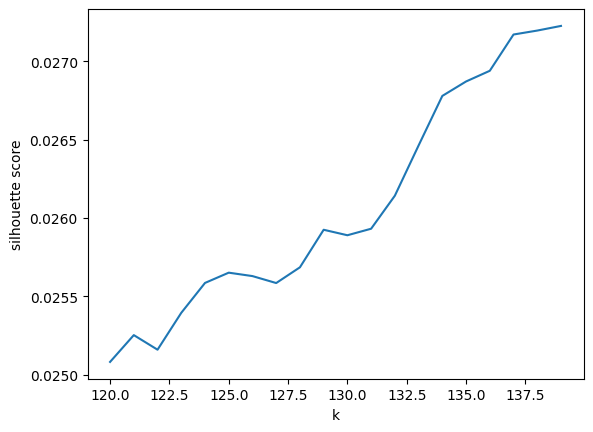

In [ ]:
x= [i for i in range(120,140)]
plt.figure()
plt.plot(x, silhouette_scores)
plt.ylabel('silhouette score')
plt.xlabel('k')
plt.show()

It can be seen that as k increases, the silhouette score improves; nevertheless the range of improvement is not very wide: it goes from 0.025 to 0.027. It can be assumed that more clusters are better for cohesion and separation, but they don't change the results that much. We can notice there isn't a good k to fix when we are using kmeans method on this type of high dimensional data.

### MiniBatchKMeans method
We apply now a variant of the KMeans clustering method designed to work efficiently with large datasets.

In [ ]:
# Fit MiniBatchMeans for a range of clusters that goes from 1 to 500
performance = [MiniBatchKMeans(n_clusters=k, batch_size=500, random_state=2307).fit(vector_documents).inertia_ for k in range(1,500)]
performance

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[33272.57358080484,
 33186.22461798395,
 33128.36069291565,
 33076.081726308366,
 33271.02504056237,
 32951.16298345526,
 32891.91519600359,
 32889.10866227561,
 32823.649878649776,
 32868.47284545051,
 32745.188067801813,
 32700.62946012028,
 32616.29725601783,
 33256.564012753326,
 32548.857913681728,
 32558.24077883293,
 33237.32633187344,
 33239.412343092954,
 32432.437777731946,
 33242.819711759425,
 33238.82192440243,
 33147.54982285081,
 33234.687125419165,
 33235.917814998844,
 33214.73527633011,
 33228.90163419544,
 32343.583206215368,
 32191.419471556732,
 33221.848471952624,
 33227.44072516097,
 33141.255587066815,
 33165.05598648921,
 33142.746519492975,
 33210.00942833184,
 33215.53963919323,
 33137.80008368069,
 33136.273352015065,
 33208.25606175844,
 33213.570297059596,
 33210.3376146439,
 33129.49314288481,
 33105.35852644761,
 33118.59661950781,
 33138.840980225345,
 33187.70711681921,
 33195.09328720799,
 33201.80287011803,
 33188.92922327247,
 33074.378773112614,
 3

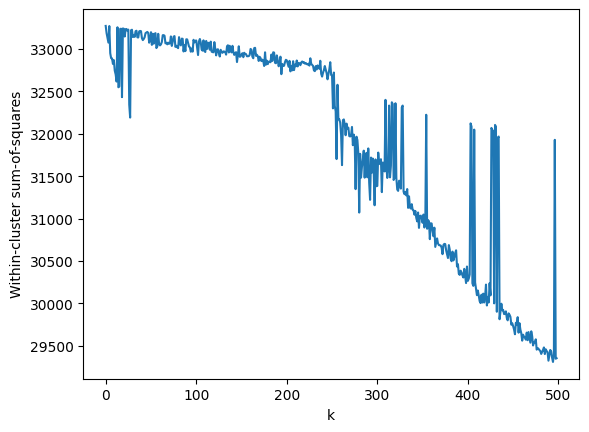

In [ ]:
plt.figure()
plt.plot(performance)
plt.ylabel('Within-cluster sum-of-squares')
plt.xlabel('k')
plt.show()

The performance is better for a higher k, but we cannot still able to choose a good number of clusters.

### LDA clustering

In [ ]:
# Divide dataset in train and test set
documents_train, documents_test = train_test_split(documents, test_size=0.2)

In [ ]:
# Initialize vectorizer and fit on the train set
vectorizer = CountVectorizer(stop_words='english',min_df=5,max_df=.5)
vectorizer = vectorizer.fit(documents_train)

In [ ]:
joblib.dump(vectorizer, 'count_vectorizer.pkl')

['count_vectorizer.pkl']

In [ ]:
vectorizer = joblib.load('count_vectorizer.pkl')

In [ ]:
vocab = vectorizer.get_feature_names_out()
print('The length of the vocabulary is', len(vocab))

The length of the vocabulary is 9843


In [ ]:
# Fitting the LatentDirichletAllocation model to the training data
lda = LatentDirichletAllocation(n_components=100, verbose=1, learning_method='online', max_iter=30)
lda.fit(vectorizer.transform(documents_train))

iteration: 1 of max_iter: 30
iteration: 2 of max_iter: 30
iteration: 3 of max_iter: 30
iteration: 4 of max_iter: 30
iteration: 5 of max_iter: 30
iteration: 6 of max_iter: 30
iteration: 7 of max_iter: 30
iteration: 8 of max_iter: 30
iteration: 9 of max_iter: 30
iteration: 10 of max_iter: 30
iteration: 11 of max_iter: 30
iteration: 12 of max_iter: 30
iteration: 13 of max_iter: 30
iteration: 14 of max_iter: 30
iteration: 15 of max_iter: 30
iteration: 16 of max_iter: 30
iteration: 17 of max_iter: 30
iteration: 18 of max_iter: 30
iteration: 19 of max_iter: 30
iteration: 20 of max_iter: 30
iteration: 21 of max_iter: 30
iteration: 22 of max_iter: 30
iteration: 23 of max_iter: 30
iteration: 24 of max_iter: 30
iteration: 25 of max_iter: 30
iteration: 26 of max_iter: 30
iteration: 27 of max_iter: 30
iteration: 28 of max_iter: 30
iteration: 29 of max_iter: 30
iteration: 30 of max_iter: 30


LatentDirichletAllocation(learning_method='online', max_iter=30,
                          n_components=100, verbose=1)

In [ ]:
# Save LDA model
joblib.dump(lda, 'lda_model.pkl')

['lda_model.pkl']

In [ ]:
lda = joblib.load('lda_model.pkl')

In [ ]:
# Transforming test documents into vector format using the same vectorizer
vector_documents_test = vectorizer.transform(documents_test)

# Calculating the perplexity of the LDA model on the test data
lda.perplexity(vector_documents_test)

18116.806263758175

Perplexity is a measure of how well the model predicts the train dataset. This value is big so the model doesn't seem to fit the sample well.







Now we want to expect the category.

In [ ]:
# Choose document number
doc_number=555

In [ ]:
topic_vec = lda.transform(vector_documents_test[doc_number])

topic_vec

array([[0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.11222222, 0.00111111, 0.00111111, 0.00111111, 0.66777778,
        0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.11222222, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
        0.00111111, 0.00111111, 0.00111111, 0.00

In [ ]:
sorted_prevalence = sorted(topic_vec)[::-1]
sorted_topics = topic_vec.argsort()[::-1]

print(sorted_topics)
print(sorted_prevalence)

[[ 0 73 72 70 69 68 67 66 64 63 74 62 60 58 57 56 54 53 52 51 50 61 98 75
  77 97 96 95 94 93 92 91 90 89 76 88 86 85 84 83 82 81 80 79 78 87 48 49
  46 22 21 20 19 18 17 16 15 14 13 23 12 10  9  8  7  6  5  4  3  2  1 11
  24 25 26 45 44 43 42 41 40 39 38 37 47 36 34 33 32 31 30 29 28 27 35 99
  71 65 55 59]]
[array([0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111, 0.00111111, 0.00111111, 0.00111111, 0.00111111,
       0.00111111

Now we visualize all the topic with their words.

In [ ]:
for i in range(len(lda.components_)):
    sorted_terms = lda.components_[i].argsort()[::-1]
    concatenated_terms = '[' + ', '.join(vocab[i] for i in sorted_terms[:30]) + ']'
    print (f'Topic {i + 1}:\t', concatenated_terms)

Topic 1:	 [dna, binding, cell, bind, chain, replication, reverse, langerhans, particles, electron, inhibiting, microscopy, strand, granules, growing, analog, transcriptase, 65, nucleoside, aid, pcr, nrtis, adp, compound, facilitate, histiocytosis, microtubules, antigenic, exclusively, peptides]
Topic 2:	 [acute, potential, complication, plasma, activation, fibrosis, pancreatitis, cystic, ca2, total, men, glomerular, 50, coagulation, approximately, percentage, disseminated, 40, dic, intravascular, capillaries, cascade, 60, intrinsic, filtered, intubation, factors, lead, qt, bound]
Topic 3:	 [tibial, tardive, fibrocystic, voltage, gated, henoch, tremens, adnexal, gabaa, pci, boerhaave, schonlein, sole, scrotal, taenia, sciatic, popping, prodrome, walker, dandy, socket, worst, ligand, offending, vermis, solium, cloning, melena, introduced, circle]
Topic 4:	 [tissue, water, central, pancreatic, body, location, structures, fat, highly, nervous, spread, cysts, mouth, pancreas, infectious, do

Using chatGPT, we assign labels to each cluster.

In [ ]:
topic_labels = [
    "DNA Replication and Molecular Biology",
    "Acute Complications and Coagulation Disorders",
    "Neurological and Musculoskeletal Conditions",
    "Pancreatic and Central Tissue Structures",
    "Respiratory and Esophageal Conditions",
    "Infectious Diseases and Pharmacology",
    "Cellular and Microscopic Techniques",
    "Vascular and Nephrological Conditions",
    "Thyroid and Endocrine Disorders",
    "Renal and Electrolyte Imbalances",
    "Genetic Mutations and Diseases",
    "Rare Diseases and Hematological Conditions",
    "Dermatological and Muscular Disorders",
    "Pharmacotherapy and Treatments",
    "Infectious Diseases and Hematological Disorders",
    "Diagnostic Approaches and Presentations",
    "Public Health and Genetic Analysis",
    "Excretory and Ductal Systems",
    "Ophthalmology and Visual Disorders",
    "Streptococcal and Bacterial Infections",
    "Psychiatric and Oncological Conditions",
    "Metabolic and Cardiovascular Diseases",
    "Genetic Disorders and Inheritance",
    "Immunological and Cellular Responses",
    "Cancer and Oncogenic Infections",
    "Hepatology and Immunizations",
    "Pulmonology and Respiratory Conditions",
    "Rheumatology and Immune Disorders",
    "Oncology and Genetic Susceptibility",
    "Virology and Molecular Biology",
    "Viral Infections and Congenital Conditions",
    "Neurology and Degenerative Diseases",
    "Clinical Management and Therapeutics",
    "Gastrointestinal and Vascular Anomalies",
    "Cancer Risk and Screening",
    "Diagnostic Imaging and Tumors",
    "Pediatric and Traumatic Conditions",
    "Fluid Dynamics and Toxin Absorption",
    "Gastroenterology and Common Disorders",
    "Neurological and Substance Disorders",
    "Microbiology and Hospital Management",
    "Neurology and Endocrine Function",
    "Obstetrics and Gynecological Health",
    "Hematology and Viral Infections",
    "Emergency Medical Conditions",
    "Genetic Disorders and Physiological Conditions",
    "Pulmonary Function and Aging",
    "Neurology and Spinal Disorders",
    "Endocrinology and Metabolic Processes",
    "Neurocognitive Disorders and Behavioral Changes",
    "Neurocognitive Disorders and Behavioral Changes",
    "Immune Response and Cellular Differentiation",
    "Potential Consequences and Prognosis",
    "Rare Genetic Disorders and Hematological Conditions",
    "Renal Function and Acid-Base Balance",
    "Hematological Findings and Anticoagulation",
    "Infectious Diseases and Systemic Symptoms",
    "Enzymatic Activity and Metabolic Pathways",
    "Congenital Disorders and Pediatric Conditions",
    "Blood Disorders and Hematopoiesis",
    "Liver Diseases and Medication Effects",
    "Neurological and Oncological Conditions",
    "Autoimmune Diseases and Inflammatory Responses",
    "Severe Infections and Complications",
    "Bacterial Structure and Infections",
    "Protocols and Specific Conditions",
    "Clinical Presentations and Diagnostic Indicators",
    "Protein and Genetic Function",
    "Neurological and Muscle Disorders",
    "Pharmacotherapy and Anticoagulants",
    "Gynecological and Dermatological Conditions",
    "General Preventive Measures and Infections",
    "Surgical Interventions and Complications",
    "Endocrine Gland Disorders and Hormones",
    "Neurological Manifestations and Lesions",
    "Common Symptoms and Conditions",
    "Drug Classes and Pharmacodynamics",
    "Respiratory and Pulmonary Conditions",
    "Dermatological and Opportunistic Infections",
    "Vascular and Cardiac Conditions",
    "Neurotransmitter Function and Neuromuscular Disorders",
    "Calcium and Bone Metabolism",
    "Receptor Mechanisms and Vascular Function",
    "Thyroid and Endocrine Imbalances",
    "Cardiac Function and Heart Disease",
    "Women’s Health and Nutritional Deficiencies",
    "Chronic Conditions and Management",
    "Vascular Access and Surgical Techniques",
    "Renal Pathology and Infections",
    "Metabolic Pathways and Cellular Functions",
    "Bacterial Infections and Treatment",
    "Neurological Pathways and Lesions",
    "Psychiatric Disorders and Treatments",
    "Microbiological Diagnostics and Sensitivity",
    "Toxicology and Environmental Exposure",
    "Hormonal and Weight Changes",
    "Lipid Metabolism and Cardiovascular Risk",
    "Oxygen Transport and Nutritional Deficiencies",
    "Hematological Disorders and Genetic Syndromes",
    "Cell Cycle and Microorganism Growth"
]

In [ ]:
documents_test[doc_number]

'What potential side effect may occur in patients who are taking stimulants? Patients on stimulants may develop tics.'

Now we check if the relationship between the documents and the topic. The topic_labels[sorted_topics[0][99]] is the one with higher probability.



In [ ]:
print("topic of the question:", topic_labels[sorted_topics[0][99]])

topic of the question: Blood Disorders and Hematopoiesis


In conclusion, applying clustering, like k-means and LDA methods, to medAlpaca dataset doesn't fit well and give few results.

## Index

In the following cell, we index our dataset. The index, with all its data structures, is written into a directory that we will call `index_3docs`. Once that the index is created it will be possible given a keyword to look for the most relevant question/answer pair.

In [ ]:
!pip install -q python-terrier

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.6/69.6 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 337.9/337.9 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.8/48.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.1/45.1 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.3 MB/s eta 0:00:00
  Preparing metadata (setup.

In [ ]:
# Import library used in this cell
import pandas as pd
import pyterrier as pt

Generate data frame

In [ ]:
pd.set_option('display.max_colwidth', 150)

In [ ]:
docnos = [f"d{i+1}" for i in range(len(dataset))]
input = [sample["input"] for sample in dataset]
output = [sample["output"] for sample in dataset]
new_dataset = {"docno": docnos, "input": input, "output": output}

docs_df = pd.DataFrame(new_dataset)
docs_df

,docno,input,output
0,d1,"What is the relationship between very low Mg2+ levels, PTH levels, and Ca2+ levels?",Very low Mg2+ levels correspond to low PTH levels which in turn results in low Ca2+ levels.
1,d2,What leads to genitourinary syndrome of menopause (atrophic vaginitis)?,Low estradiol production leads to genitourinary syndrome of menopause (atrophic vaginitis).
2,d3,What does low REM sleep latency and experiencing hallucinations/sleep paralysis suggest?,Low REM sleep latency and experiencing hallucinations/sleep paralysis suggests narcolepsy.
3,d4,What are some possible causes of low PTH and high calcium levels?,"PTH-independent hypercalcemia, which can be caused by cancer, granulomatous disease, or vitamin D intoxication."
4,d5,How does the level of anti-müllerian hormone relate to ovarian reserve?,The level of anti-müllerian hormone is directly related to ovarian reserve - a lower level indicates a lower ovarian reserve.
...,...,...,...
33950,d33951,At what age does bed wetting (enuresis) become a concern?,"At the age of 5 or older, bed wetting (enuresis) may become a concern and should be evaluated by a healthcare provider."
33951,d33952,,
33952,d33953,,
33953,d33954,,


In [ ]:
if not pt.started():
  pt.init()

terrier-assemblies 5.9 jar-with-dependencies not found, downloading to /root/.pyterrier...
Done
terrier-python-helper 0.0.8 jar not found, downloading to /root/.pyterrier...
Done


PyTerrier 0.10.1 has loaded Terrier 5.9 (built by craigm on 2024-05-02 17:40) and terrier-helper 0.0.8



Create index on the output

In [ ]:
indexer = pt.DFIndexer("./index_3docs", overwrite=True)
index_ref = indexer.index(docs_df["output"], docs_df["docno"])
index_ref.toString()

08:32:47.888 [main] WARN org.terrier.structures.indexing.Indexer - Adding an empty document to the index (d7718) - further warnings are suppressed
08:33:18.721 [main] WARN org.terrier.structures.indexing.Indexer - Indexed 406 empty documents


'./index_3docs/data.properties'

In [ ]:
# Load the index
index = pt.IndexFactory.of(index_ref)

In [ ]:
print(index.getCollectionStatistics().toString())

Number of documents: 33955
Number of terms: 15718
Number of postings: 784889
Number of fields: 0
Number of tokens: 1051508
Field names: []
Positions:   false



Now we can run a search on our collection

In [ ]:
query = "choriocarcinoma"

br = pt.BatchRetrieve(index, wmodel="TF_IDF")
res_Tf_Idf = br.search(query)
res_Tf_Idf

,qid,docid,docno,rank,score,query
0,1,11458,d11459,0,8.368590,choriocarcinoma
1,1,6807,d6808,1,8.239219,choriocarcinoma
2,1,33433,d33434,2,8.115510,choriocarcinoma
3,1,8348,d8349,3,8.076809,choriocarcinoma
4,1,15613,d15614,4,7.920679,choriocarcinoma
5,1,4087,d4088,5,7.843642,choriocarcinoma
6,1,11656,d11657,6,7.838560,choriocarcinoma
7,1,19435,d19436,7,7.770470,choriocarcinoma
8,1,30479,d30480,8,7.769280,choriocarcinoma
9,1,30480,d30481,9,7.554418,choriocarcinoma


In [ ]:
# Print first four question/answer pair retrieved by TF_IDF
docIds_Tf_Idf = res_Tf_Idf['docid'].head(4).tolist()
for docid in docIds_Tf_Idf:
  print("\n")
  print(docs_df.loc[docid])



docno                                                                                                                                                    d11459
input     If a woman who is 6 months postpartum presents with an enlarged uterus, irregular vaginal bleeding, dyspnea, and multiple infiltrates on CXR, what...
output    The probable diagnosis is choriocarcinoma, which is a rare type of cancer that develops from the cells that would normally form the placenta durin...
Name: 11458, dtype: object


docno                                                                                   d6808
input                        What is the chemotherapeutic drug used to treat choriocarcinoma?
output    Methotrexate is the chemotherapeutic drug used in the treatment of choriocarcinoma.
Name: 6807, dtype: object


docno                                                                                                                                                    d33434
input              

In [ ]:
# Print last two question/answer pair retrieved by TF_IDF
docIds_Tf_Idf_tail = res_Tf_Idf['docid'].tail(2).tolist()
for docid in docIds_Tf_Idf_tail:
  print("\n")
  print(docs_df.loc[docid])



docno                                                                                                                                                    d24164
input                                                   What type of hydatidiform mole is typically associated with the malignant progression to invasive mole?
output    The malignant progression to invasive mole is typically associated with a complete hydatidiform mole. A hydatidiform mole is a rare type of abnorm...
Name: 24163, dtype: object


docno                                                                                                                                                     d9662
input                          What is the recommended approach for managing a suspected theca luteum cyst in a pregnant woman with a complete molar pregnancy?
output    The recommended approach for managing a suspected theca luteum cyst in a pregnant woman with a complete molar pregnancy is suction curettage of th...
Name: 966

Let's try to search again, but this time with BM25

In [ ]:
query = "choriocarcinoma"

bm25 = pt.BatchRetrieve(index, wmodel="BM25")
res_bm25 = bm25.search(query)
res_bm25

,qid,docid,docno,rank,score,query
0,1,11458,d11459,0,15.306212,choriocarcinoma
1,1,6807,d6808,1,15.069590,choriocarcinoma
2,1,33433,d33434,2,14.843325,choriocarcinoma
3,1,8348,d8349,3,14.772541,choriocarcinoma
4,1,15613,d15614,4,14.486977,choriocarcinoma
5,1,4087,d4088,5,14.346078,choriocarcinoma
6,1,11656,d11657,6,14.336782,choriocarcinoma
7,1,19435,d19436,7,14.212244,choriocarcinoma
8,1,30479,d30480,8,14.210068,choriocarcinoma
9,1,30480,d30481,9,13.817084,choriocarcinoma


In [ ]:
# Print first four question/answer pair retrieved by BM25
docIds_bm25 = res_bm25['docid'].head(4).tolist()
for docid in docIds_bm25:
  print("\n")
  print(docs_df.loc[docid])



docno                                                                                                                                                    d11459
input     If a woman who is 6 months postpartum presents with an enlarged uterus, irregular vaginal bleeding, dyspnea, and multiple infiltrates on CXR, what...
output    The probable diagnosis is choriocarcinoma, which is a rare type of cancer that develops from the cells that would normally form the placenta durin...
Name: 11458, dtype: object


docno                                                                                   d6808
input                        What is the chemotherapeutic drug used to treat choriocarcinoma?
output    Methotrexate is the chemotherapeutic drug used in the treatment of choriocarcinoma.
Name: 6807, dtype: object


docno                                                                                                                                                    d33434
input              

In [ ]:
# Print last two question/answer pair retrieved by TF_IDF
docIds_bm25_tail = res_Tf_Idf['docid'].tail(2).tolist()
for docid in docIds_bm25_tail:
  print("\n")
  print(docs_df.loc[docid])



docno                                                                                                                                                    d24164
input                                                   What type of hydatidiform mole is typically associated with the malignant progression to invasive mole?
output    The malignant progression to invasive mole is typically associated with a complete hydatidiform mole. A hydatidiform mole is a rare type of abnorm...
Name: 24163, dtype: object


docno                                                                                                                                                     d9662
input                          What is the recommended approach for managing a suspected theca luteum cyst in a pregnant woman with a complete molar pregnancy?
output    The recommended approach for managing a suspected theca luteum cyst in a pregnant woman with a complete molar pregnancy is suction curettage of th...
Name: 966

In conclusion, indexing the dataset seems to bring good results. Both TF_IDF and BM25 give same document ranking as result even if with different scores, moreover first four asnwers found satisfy correctly our query, against the last two that seems to be not very related.


## Word2Vec embedding
In this cell, we apply words embedding.

In [ ]:
!pip install --upgrade gensim

In [ ]:
# Import library used in this cell
from gensim.models import Word2Vec
from sklearn.decomposition import PCA

Convert the dataset into the right format

In [ ]:
# Create a text with input and output sentence togheter
sentences = []
for entry in dataset:
    input_text = nltk.word_tokenize(entry['input'].lower())
    output_text = nltk.word_tokenize(entry['output'].lower())
    sentences.append(input_text)
    sentences.append(output_text)

sentences[:40]

[['what',
  'is',
  'the',
  'relationship',
  'between',
  'very',
  'low',
  'mg2+',
  'levels',
  ',',
  'pth',
  'levels',
  ',',
  'and',
  'ca2+',
  'levels',
  '?'],
 ['very',
  'low',
  'mg2+',
  'levels',
  'correspond',
  'to',
  'low',
  'pth',
  'levels',
  'which',
  'in',
  'turn',
  'results',
  'in',
  'low',
  'ca2+',
  'levels',
  '.'],
 ['what',
  'leads',
  'to',
  'genitourinary',
  'syndrome',
  'of',
  'menopause',
  '(',
  'atrophic',
  'vaginitis',
  ')',
  '?'],
 ['low',
  'estradiol',
  'production',
  'leads',
  'to',
  'genitourinary',
  'syndrome',
  'of',
  'menopause',
  '(',
  'atrophic',
  'vaginitis',
  ')',
  '.'],
 ['what',
  'does',
  'low',
  'rem',
  'sleep',
  'latency',
  'and',
  'experiencing',
  'hallucinations/sleep',
  'paralysis',
  'suggest',
  '?'],
 ['low',
  'rem',
  'sleep',
  'latency',
  'and',
  'experiencing',
  'hallucinations/sleep',
  'paralysis',
  'suggests',
  'narcolepsy',
  '.'],
 ['what',
  'are',
  'some',
  'possible',

In [ ]:
# Remove stopwords
sentences_nostopwords = [[w for w in words if w not in stopwords.words('english')] for words in sentences]

# Remove 5W words
sentences_no5w = [[w for w in words if w not in ['what', 'where', 'who', 'why', 'when', 'how', 'which']] for words in sentences_nostopwords]

# Remove punctuation
sentences_clean = [[w for w in words if w not in string.punctuation] for words in sentences_no5w]

In [ ]:
# Create Word2Vec model
model = Word2Vec(sentences_clean, vector_size=200, window=5, min_count=3, workers=4)

# Save the model
model.save("word2vec.model")

We search the most frequent words linked to the word pain.

In [ ]:
similar_words = model.wv.most_similar('pain', topn=10)
print("Words most similar to 're':", similar_words)

Words most similar to 're': [('constipation', 0.6761142015457153), ('distention', 0.6652300953865051), ('bloating', 0.6507739424705505), ('discomfort', 0.6497182250022888), ('vomiting', 0.6492137312889099), ('itching', 0.6451454162597656), ('swelling', 0.6243589520454407), ('nausea', 0.6213740706443787), ('tenderness', 0.6142991781234741), ('cramping', 0.5938442945480347)]


Given a word, the model is able to discrimite the most similar ones relating to different medical fields.

Now we visualize the first 40 words in a graph.

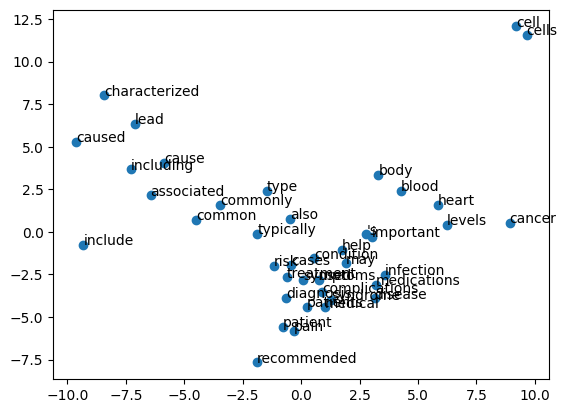

In [ ]:
# Take the first 40 words from the Word2Vec template
words = list(model.wv.key_to_index.keys())[:40]

# Get vectors for these words
vectors = [model.wv[word] for word in words]

# Reduce dimensionality to 2
pca = PCA(n_components=2)
result = pca.fit_transform(vectors)

# Create a scatter plot
plt.scatter(result[:, 0], result[:, 1])

# Add word labels
for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))

plt.show()

Also the graph show a good relationship between the words.

In conclusion, words embedding works quite well.

# Model training

In this section we train t5-base model, giving also a contest taken from wikipedia.

## Preparing the dataset for training

Preliminary analysis, check if all the lines contain a question-answer pair and other checks like that.

### General preprocessing

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd

In [ ]:
datafile_path = "medical_meadow_wikidoc_medical_flashcards.json"

In [ ]:
# Load the dataset and view it
from datasets import load_dataset, DatasetDict, Dataset
huggingface_dataset = load_dataset('json', data_files=datafile_path)
dataset = huggingface_dataset['train']
dataset

Generating train split: 0 examples [00:00, ? examples/s]

Dataset({
    features: ['output', 'instruction', 'input'],
    num_rows: 33955
})

In [ ]:
# Rename the colunms name for semplicity
dataset = dataset.rename_column('input', 'question')
dataset = dataset.rename_column('output', 'answer')

In [ ]:
# Utility functions
def check_data(dataset):
    # Convert dataset to pandas DataFrame for easier manipulation
    df = pd.DataFrame(dataset)

    # Check for missing or empty values in `answer` and `question` fields
    empty_mask = (df['answer'].isna() | df['answer'].str.strip().eq('')) | (df['question'].isna() | df['question'].str.strip().eq(''))

    # Get the indices of missing or empty data
    anomaly_indices = np.where(empty_mask)[0]

    print(f"Found anomalies or missing data at these indices (total: {len(anomaly_indices)}):")
    print(", ".join(map(str, anomaly_indices)))
    return anomaly_indices

def is_valid(entry):
    # Check if 'question' or 'answer' fields are empty or contain only whitespace
    if not entry['question'].strip() or not entry['answer'].strip():
        return False
    return True

def add_field(my_dict, field_name):
    my_dict[field_name] = ''
    return my_dict

def remove_field(my_dict, field_name):
    if field_name in my_dict:
      del my_dict[field_name]
    else:
      print("Error, field name not present in the dictionary.")
    return my_dict

In [ ]:
anomaly_indexes = check_data(dataset)

Found anomalies or missing data at these indices (total: 408):
4834, 10355, 10371, 13374, 13954, 13981, 13984, 14129, 14130, 14133, 18256, 18258, 18627, 19729, 19963, 20022, 20970, 21415, 22295, 22299, 22762, 22763, 22764, 22765, 22766, 22767, 22768, 22769, 22770, 22771, 22772, 22773, 22774, 22775, 22776, 22777, 22778, 22779, 22780, 22781, 22782, 22783, 22784, 22785, 22786, 22787, 22788, 22789, 22790, 22791, 22792, 22793, 22794, 22795, 22796, 22797, 22798, 22799, 22800, 22801, 22802, 22803, 22804, 22805, 22806, 22807, 22808, 22809, 22810, 22811, 22812, 22813, 22814, 22815, 22816, 22817, 22818, 22819, 22820, 22821, 22822, 22823, 22824, 22825, 22826, 22827, 22828, 22829, 22830, 22831, 22832, 22833, 22834, 22835, 22836, 22837, 22838, 22839, 22840, 22841, 22842, 22843, 22844, 22845, 22846, 22847, 22848, 22849, 22850, 22851, 22852, 22853, 22854, 22855, 22856, 22857, 22858, 22859, 22860, 22861, 22862, 22863, 22864, 22865, 22866, 22867, 22868, 22869, 22870, 22871, 22872, 22873, 22874, 22875, 

In [ ]:
# Apply the filter function to the dataset
cleaned_dataset = dataset.filter(is_valid)

Filter:   0%|          | 0/33955 [00:00<?, ? examples/s]

Now we decided to remove the 'instruction' field, as it contains always the same sentence.

In [ ]:
# Remove the 'instruction' field since it's useless
modified_dataset = cleaned_dataset.map(remove_field, fn_kwargs={'field_name': 'instruction'})
modified_dataset

Map:   0%|          | 0/33547 [00:00<?, ? examples/s]

Dataset({
    features: ['answer', 'question'],
    num_rows: 33547
})

Lets split the dataset into training and validation. We didn't create a test dataset because we thought that the training data would contain too few entries.

In [ ]:
# Define a function for splitting
def split_and_create(dataset, t_size):
  # Convert to pandas DataFrame for splitting
  df = modified_dataset.to_pandas()

  # Split the dataset into training and validation DataFrames
  train_df, val_df = train_test_split(df, test_size=t_size)

  # Convert DataFrames back into Datasets
  train_dataset = Dataset.from_pandas(train_df)
  val_dataset = Dataset.from_pandas(val_df)

  return train_dataset, val_dataset

In [ ]:
train_dataset, val_dataset = split_and_create(cleaned_dataset, 0.1)

In [ ]:
# Create a DatasetDict to hold the splits
dataset_dict = DatasetDict({
    'train': train_dataset,
    'validation': val_dataset
})

In [ ]:
dataset_dict

DatasetDict({
    train: Dataset({
        features: ['answer', 'question', '__index_level_0__'],
        num_rows: 30192
    })
    validation: Dataset({
        features: ['answer', 'question', '__index_level_0__'],
        num_rows: 3355
    })
})

### Creating a dataset for RAG

We also thought it would be great to have a dataset with the context associated to each question, so that we could train a RAG model, so we proceeded like this:


In [ ]:
# Run this cell and then restart the runtime session, and then skip this cell
!pip install accelerate -U --quiet

In [ ]:
!pip install hnswlib
!pip install sentence_transformers

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for hnswlib: filename=hnswlib-0.8.0-cp310-cp310-linux_x86_64.whl size=2319653 sha256=72b9c15e64c587c28fc0a5e2d0015b8cb14dae961cde7886644dfcbdfe08db14
  Stored in directory: /root/.cache/pip/wheels/af/a9/3e/3e5d59ee41664eb31a4e6de67d1846f86d16d93c45f277c4e7
Successfully built hnswlib
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 1.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-no

In [ ]:
import json
import torch
import hnswlib
from tqdm import tqdm
import os

We found this dataset online, containing almost 400000 wikipedia pages related to medicine. We visualize the dataset.

In [ ]:
wikimed_filepath = "WikiMed.json"
wikimed_dataset = load_dataset('json', data_files=wikimed_filepath, split='train')

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
wikimed_dataset

Dataset({
    features: ['_id', 'text', 'title', 'split', 'mentions'],
    num_rows: 393618
})

Then we have to load the models for the passage retrieval.

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

In [ ]:
from sentence_transformers import SentenceTransformer, CrossEncoder, util
semb_model = SentenceTransformer('multi-qa-MiniLM-L6-cos-v1')
xenc_model = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2', device=device)
semb_model = semb_model.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/383 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
# Make a copy of the original dataset
dataset_with_context = modified_dataset

Then, we load the embeddings generated with the following cell (it tooks a lot :|)

In [ ]:
with open("passages.json", 'r') as f:
  passages = json.load(f)

In [ ]:
WikiMed_passages_embedding = semb_model.encode(passages, convert_to_tensor=True, show_progress_bar=True)

Batches:   0%|          | 0/4093 [00:00<?, ?it/s]

In [ ]:
path = 'WikiMed_passages_embedding.pt'
corpus_embeddings = torch.load(path, map_location=torch.device(device))
index = hnswlib.Index(space='cosine', dim=corpus_embeddings.size(1))

Then we also need to load the wikimed generated index (it also tooks a lot)

In [ ]:
# Define hnswlib index path
index_path = "hnswlib_WikiMed.index"
# Load index if available
if os.path.exists(index_path):
    print("Path exists. ")
    print("Loading index...")
    index.load_index(index_path)
    # Else index data collection
else:
    # Initialise the index
    print("Creating HNSWLIB index...")
    index.init_index(max_elements=corpus_embeddings.size(0), ef_construction=400, M=64)
    #  Compute the HNSWLIB index (it may take a while)
    index.add_items(corpus_embeddings.cpu(), list(range(len(corpus_embeddings))))
    # Save the index to a file for future loading
    print("Saving index to:", index_path)
    index.save_index(index_path)

Path exists. 
Loading index...


In [ ]:
with open("passages.json", 'r') as f:
  passages = json.load(f)
# View the a random passage
passages[2139]

'Stanley Cohen (sociologist)\n\nStanley Cohen (23 February 1942 – 7 January 2013) was a sociologist and criminologist, Professor of Sociology at the London School of Economics, known for breaking academic ground on "emotional management", including the mismanagement of emotions in the form of sentimentality, overreaction, and emotional denial. He had a lifelong concern with human rights violations, first growing up in South Africa, later studying imprisonment in England and finally in Palestine. He founded the Centre for the Study of Human Rights at the London School of Economics.\n\nCohen was born in Johannesburg, South Africa in 1942, son of a Lithuanian businessman. He grew up as a Zionist and intended to settle in Israel. He studied Sociology and Social Work as an undergraduate at the University of Witwatersrand, getting involved in anti-apartheid issues.\n\nHe came to London in 1963, where he worked as a social worker, before completing his Ph.D at London School of Economics (LSE)

As we can see from the passage above, not all the articles contain medical knowledge. This is probably due to how the dataset was created. We also need to clean up the passages.

In [ ]:
def clean_passage(input_text):
    # Split the text into a list of lines
    lines = input_text.split('\n')
    # Remove the first line (the title)
    lines = lines[1:]
    # Remove lines that start with "BULLET::::"
    cleaned_lines = [line for line in lines if not line.startswith("BULLET::::")]
    # Join the remaining lines back into a single string
    cleaned_text = '\n'.join(cleaned_lines)

    return cleaned_text

In [ ]:
for i in tqdm(range(len(passages))):
    passages[i] = clean_passage(passages[i])
passages[2139]

100%|██████████| 130948/130948 [00:06<00:00, 18903.98it/s]


'\nStanley Cohen (23 February 1942 – 7 January 2013) was a sociologist and criminologist, Professor of Sociology at the London School of Economics, known for breaking academic ground on "emotional management", including the mismanagement of emotions in the form of sentimentality, overreaction, and emotional denial. He had a lifelong concern with human rights violations, first growing up in South Africa, later studying imprisonment in England and finally in Palestine. He founded the Centre for the Study of Human Rights at the London School of Economics.\n\nCohen was born in Johannesburg, South Africa in 1942, son of a Lithuanian businessman. He grew up as a Zionist and intended to settle in Israel. He studied Sociology and Social Work as an undergraduate at the University of Witwatersrand, getting involved in anti-apartheid issues.\n\nHe came to London in 1963, where he worked as a social worker, before completing his Ph.D at London School of Economics (LSE) about the social reactions t

Ok, now let's save the passages that are the most related to each question according to semantic search.

In [ ]:
def save_best_passages(questions, passages_list, segment_index, percent_size):

    # initialize local empty list
    best_passages = []

    max_segment = int(1 / percent_size) + 1
    if segment_index <= 0 or segment_index > max_segment:
        raise ValueError(f'\'Segment index\' should have a value between 1 and {max_segment}.')

    number_of_questions = len(questions)

    # percentage of the total questions list
    segment_size = int(number_of_questions * percent_size)

    print(f"Number of questions: {number_of_questions}")
    print(f"Percent size: {percent_size}; Segment size: {segment_size}")

    # Calculate the starting and ending indices of the segment
    start_index = (segment_size * (segment_index - 1))
    end_index = start_index + segment_size
    # to ensure it doesn't overflow the length of the list
    end_index = min(end_index, number_of_questions)
    # to ensure it reaches all the elements of the segment isn't big enough
    if(end_index + segment_size > number_of_questions):
        end_index = number_of_questions

    print(f"Start index: {start_index}, end_index: {end_index}")

    # Process only the specified given% segment of the questions
    questions_segment = questions[start_index:end_index]
    for query in tqdm(questions_segment):
        # Query embedding
        query_embedding = semb_model.encode(query, convert_to_tensor=True)
        # Search using ANN index
        corpus_ids, distances = index.knn_query(query_embedding.cpu(), k=64)
        # Re-ranking
        model_inputs = [(query, passages_list[idx]) for idx in corpus_ids[0]]
        cross_scores = xenc_model.predict(model_inputs)
        max_score_idx = np.argsort(-cross_scores)[0]
        best_passage = passages_list[corpus_ids[0][max_score_idx]]
        best_passages.append(best_passage)

    return best_passages

Since doing this for all the dataset would have taken too long, we decided to do it in subsets, each containing 1/5 of the entire dataset, and then we concatenated them.

In [ ]:
best_passages_subset = []

In [ ]:
# Here, segment number is the subset of the dataset that we are processing
PERCENT_SIZE = 0.2
SEGMENT_NUMBER = 4

In [ ]:
# This also took long
best_passages_subset = save_best_passages(questions, passages, SEGMENT_NUMBER, PERCENT_SIZE)

Then we saved each subset to file.

In [ ]:
best_passages_filename = 'best_passages_' + str(SEGMENT_NUMBER) + '.json'

def write_best_passages_to_file(passages):
    # Serialize data to JSON format
    serialized_data = json.dumps(best_passages_subset)
    # Open a file for writing
    with open(best_passages_filename, 'w') as f:
        # Write the JSON data to the file
        f.write(serialized_data)

In [ ]:
write_best_passages_to_file(best_passages_subset)

Finally, after all subsets were done, we proceeded to concatenate the datasets.

In [ ]:
dataset1 = './best_passages_1.json'
dataset2 = './best_passages_2.json'
dataset3 = './best_passages_3.json'
dataset4 = './best_passages_4.json'
dataset5 = './best_passages_5.json'

In [ ]:
from datasets import load_dataset, DatasetDict, Dataset

data1 = load_dataset('json', data_files=database1)
data1 = data1['train']

data2 = load_dataset('json', data_files=database2)
data2 = data2['train']

data3 = load_dataset('json', data_files=database3)
data3 = data3['train']

data4 = load_dataset('json', data_files=database4)
data4 = data4['train']

data5 = load_dataset('json', data_files=database5)
data5 = data5['train']

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
from datasets import concatenate_datasets
dataset_cc = concatenate_datasets([data1, data2, data3, data4, data5])

In [ ]:
from datasets import add_column
dataset_cc = dataset_cc.add_column('question', modified_dataset['question'])

dataset_cc = dataset_cc.add_column('answer', modified_dataset['answer'])

Let's see a random example of our new dataset!

In [ ]:
dataset_cc[6]

{'text': '\nHyperinsulinemic hypoglycemia describes the condition and effects of low blood glucose caused by excessive insulin. Hypoglycemia due to excess insulin is the most common type of serious hypoglycemia. It can be due to endogenous or injected insulin.\nManifestations of hyperinsulinemic hypoglycemia vary by age and severity of the hypoglycemia. In general, most signs and symptoms can be attributed to (1) the effects on the brain of insufficient glucose (neuroglycopenia) or (2) to the adrenergic response of the autonomic nervous system to hypoglycemia. A few miscellaneous symptoms are harder to attribute to either of these causes. In most cases, all effects are reversed when normal glucose levels are restored.\n\nThere are uncommon cases of more persistent harm, and rarely even death due to severe hypoglycemia of this type. One reason hypoglycemia due to excessive insulin can be more dangerous is that insulin lowers the available amounts of most alternate brain fuels, such as k

In [ ]:
# save the new dataset to file
dataset_cc.save_to_disk("dataset_mistico_con_contesto")

Saving the dataset (0/1 shards):   0%|          | 0/33547 [00:00<?, ? examples/s]

## Training models
In the second part, we evaluate different models, trained to answer medical questions. We tried with 2 pipelines:


1.   Fine tuning a model with only question-answer pairs
2.   Fine tuning the model providing context




### Train a model with question-aswer pairs


In [ ]:
# run this cell, restart the runtime session, and then skip this cell
!pip install accelerate -U --quiet

Firstly, we need to split our dataset in training and validation

In [ ]:
def split_and_create(dataset):
  # Convert to pandas DataFrame for splitting
  df = modified_dataset.to_pandas()

  # Split the dataset into training and validation DataFrames
  train_df, val_df = train_test_split(df, test_size=0.1)

  # Convert DataFrames back into Datasets
  train_dataset = Dataset.from_pandas(train_df)
  val_dataset = Dataset.from_pandas(val_df)

  return train_dataset, val_dataset

In [ ]:
train_dataset, val_dataset = split_and_create(modified_dataset)

Then we must format the dataset as a huggingface dataset

In [ ]:
# Create a DatasetDict to hold the splits
dataset_dict = DatasetDict({
    'train': train_dataset,
    'validation': val_dataset
})

Load the model and the tokenizer

In [ ]:
import transformers
import torch
from transformers import T5Tokenizer
from transformers import T5ForConditionalGeneration, Trainer, TrainingArguments

In [ ]:
model_directory = "google/flan-t5-base" # we decided to use T5 and fine tune it
model = T5ForConditionalGeneration.from_pretrained(checkpoint_directory)
tokenizer = T5Tokenizer.from_pretrained(checkpoint_directory)

let's define the maximum source and target length

In [ ]:
MAX_SOURCE_LENGTH = 128
MAX_TARGET_LENGTH = 256

now we need to define a function for preprocess and tokenize the question-answer pairs

In [ ]:
def preprocess_function(batch):

    task_prefix = "question: "
    input_sequences = [task_prefix + str(question) for question in batch['question']]
    target_sequences = [str(answer) for answer in batch['answer']]

    input_encodings = tokenizer(
        input_sequences,
        padding='max_length',
        truncation=True,
        max_length=MAX_SOURCE_LENGTH,
        return_tensors="pt"
    )

    labels = tokenizer(
        text_target=target_sequences,
        max_length=MAX_TARGET_LENGTH,
        padding='max_length',
        truncation=True,
        return_tensors="pt"
    )

    # Convert padding tokens in labels to -100
    labels['input_ids'] = torch.where(labels['input_ids'] == tokenizer.pad_token_id, torch.tensor(-100), labels['input_ids'])

    input_encodings["labels"] = labels["input_ids"]
    return input_encodings

In [ ]:
tokenized_dataset = dataset_dict.map(preprocess_function, batched=True, remove_columns=["question", "answer"])

In [ ]:
tokenized_dataset

DatasetDict({
    train: Dataset({
        features: ['answer', 'question', '__index_level_0__', 'input_ids', 'attention_mask', 'labels', 'decoder_input_ids'],
        num_rows: 30192
    })
    validation: Dataset({
        features: ['answer', 'question', '__index_level_0__', 'input_ids', 'attention_mask', 'labels', 'decoder_input_ids'],
        num_rows: 3355
    })
})

Ensuring model is on GPU.

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type != 'cuda':
    raise SystemError('GPU device not found')
print(f"Device: {device}\n")

# Move model to gpu
model = model.to(device)

# Inspect the model
print(model)

Now let's train the model.

In [ ]:
# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    weight_decay=0.01,
    learning_rate=3e-5,
    per_device_train_batch_size=32,
    gradient_accumulation_steps=4,  # Accumulate gradients over 2 steps
    num_train_epochs=5,
    logging_steps=100,
    fp16=True,  # Enable mixed precision
)

In [ ]:
from transformers import DataCollatorWithPadding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
# Initialize Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_dataset['train'],
    eval_dataset=tokenized_dataset['validation'],
    data_collator=data_collator,
)

In [ ]:
# Settings to aid memory use during training
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'
torch.cuda.empty_cache()

In [ ]:
# Train the model
trainer.train()

In [ ]:
model_name = "" #insert model name
# Save the model
model.save_pretrained("./medical_qa_model_" + model_name)
tokenizer.save_pretrained("./medical_qa_model_" + model_name)

### Retrieval Augmented Generation

load the dataset with context

In [ ]:
# Load the dataset and view it
datafile_path = 'dataset_mistico_con_contesto'

from datasets import load_from_disk, DatasetDict, Dataset
dataset = load_from_disk(datafile_path)

dataset

Dataset({
    features: ['text', 'question', 'answer'],
    num_rows: 33547
})

Now we need to preprocess and tokenize the dataset

In [ ]:
def preprocess_function(examples):
    inputs = ["question: " + q + " context: " + c for q, c in zip(examples['question'], examples['text'])]
    targets = examples['answer']
    model_inputs = tokenizer(inputs, max_length=512, truncation=True, padding='max_length')
    labels = tokenizer(targets, max_length=128, truncation=True, padding='max_length')

    model_inputs['labels'] = labels['input_ids']
    return model_inputs

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
from transformers import T5Tokenizer

tokenizer = T5Tokenizer.from_pretrained('t5-base')

tokenized_dataset = dataset.map(preprocess_function, batched=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used

We splitted the dataset. We used 10% for validation because our dataset did't contain a lot of entries, so we decided to assign most o the data to the training split.

In [ ]:
dataset_split = tokenized_dataset.train_test_split(test_size=0.1)  # 10% for validation
train_dataset = dataset_split['train']
validation_dataset = dataset_split['test']

Load the model.

In [ ]:
from transformers import T5ForConditionalGeneration

model = T5ForConditionalGeneration.from_pretrained('t5-base')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Training of the model.

In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir='content/runs',
    evaluation_strategy='epoch',
    learning_rate=3e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=2,
    weight_decay=0.01,
    fp16=True,
)


In [ ]:
import os

os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=validation_dataset,
    tokenizer=tokenizer,
)

In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss
1,0.851200,0.763400
2,0.820600,0.754087


TrainOutput(global_step=7548, training_loss=0.8904772916671518, metrics={'train_runtime': 5420.2861, 'train_samples_per_second': 11.14, 'train_steps_per_second': 1.393, 'total_flos': 3.677131326357504e+16, 'train_loss': 0.8904772916671518, 'epoch': 2.0})

In [ ]:
model.save_pretrained('./fine-tuned-t5-base')
tokenizer.save_pretrained('./fine-tuned-t5-base')

('./fine-tuned-t5-base/tokenizer_config.json',
 './fine-tuned-t5-base/special_tokens_map.json',
 './fine-tuned-t5-base/spiece.model',
 './fine-tuned-t5-base/added_tokens.json')

### Evaluate different models

For the evaluation part we found online some csv files containing medical questions that were not present in the dataset. We decided to evaluate our models on those question to test the applicability of our models to generic medical questions. The questions we used were quite different from the ones that were present in the dataset, so unfortunately the results are quite discouraging in terms of metrics. However, when displaying the answers given from the model to a specific question, they usually seem to make sense.

Load files for evaluation and preprocess them.


---

Generate answers using our model and questions from the file, and compare them.

In [ ]:
eval_csv_directory = "CSV files for evaluation"

In [ ]:
# Load csv filenames in a list
all_files = os.listdir(eval_csv_directory)
csv_files = [file for file in all_files if file.endswith('.csv')]
# Append directory name to all files
csv_files_full_path = [os.path.join(eval_csv_directory, file) for file in csv_files]

# View the files
print("CSV Files:", csv_files_full_path)

CSV Files: ['CSV files for evaluation/Heart_Lung_and_BloodQA.csv', 'CSV files for evaluation/Disease_Control_and_PreventionQA.csv', 'CSV files for evaluation/Diabetes_and_Digestive_and_Kidney_DiseasesQA.csv', 'CSV files for evaluation/Genetic_and_Rare_DiseasesQA.csv', 'CSV files for evaluation/CancerQA.csv', 'CSV files for evaluation/MedicalQuestionAnswering.csv', 'CSV files for evaluation/Neurological_Disorders_and_StrokeQA.csv', 'CSV files for evaluation/SeniorHealthQA.csv', 'CSV files for evaluation/OtherQA.csv', 'CSV files for evaluation/growth_hormone_receptorQA.csv']


In [ ]:
def preprocess_data(df):
    # Cuts the number of question mark from multiple (if present) to one
    df['Question'] = df['Question'].apply(lambda q: re.sub(r'\?+', '?', q) if isinstance(q, str) else q)
    # Filter out empty questions and answers
    df = df.dropna(subset=['Question', 'Answer'])
    # Filter out answers containing "Key Points"
    df = df[~df['Answer'].str.contains("Key Points", na=False)]
    return df

In [ ]:
csv_file_idx = 6
csv_file = csv_files_full_path[csv_file_idx]

print(csv_file)

CSV files for evaluation/Neurological_Disorders_and_StrokeQA.csv


In [ ]:
# load test questions and answers
# load a single file
df_csv = pd.read_csv(csv_file)

# preprocess the csv
df_csv = preprocess_data(df_csv)

# load questions and ground truth answers
df_questions = df_csv['Question']
df_true_answers = df_csv['Answer']

In [ ]:
# load random question and answer
random_row = df_csv.sample(n=1).iloc[0]
random_question = random_row['Question']
random_answer = random_row['Answer']

print(random_question, random_answer)

What is (are) Spinal Muscular Atrophy ? Spinal Muscular Atrophy (SMA) Types I, II, and III belong to a group of hereditary diseases that cause weakness and wasting of the voluntary muscles in the arms and legs of infants and children. The disorders are caused by an abnormal or missing gene known as the survival motor neuron gene 1 (SMN1), which is responsible for the production of a protein essential to motor neurons. Without this protein, lower motor neurons in the spinal cord degenerate and die. The type of SMA (I, II, or III) is determined by the age of onset and the severity of symptoms. Type I (also known as Werdnig-Hoffman disease, or infantile-onset SMA) is evident at birth or within the first few months. Symptoms include floppy limbs and trunk, feeble movements of the arms and legs, swallowing and feeding difficulties, and impaired breathing. Type II (the intermediate form) usually begins 6 and 18 months of age. Legs tend to be more impaired than arms. Children with Type II may

Calculate BLEU and ROUGE scores

In [ ]:
# choose model for evaluation
EVAL_MODEL = T5_BASE
EVAL_TOKENIZER = T5_BASE_TN

In [ ]:
# generate answers of our model
def generate_answers(questions, model, tokenizer, device):
  generated_answers = []
  for question in tqdm(questions):
    answer = ask_question(question, model, tokenizer, device)
    generated_answers.append(answer)
  return generated_answers

In [ ]:
# get answers of our model
generated_answers = generate_answers(df_questions, EVAL_MODEL, EVAL_TOKENIZER, device)

100%|██████████| 1088/1088 [09:24<00:00,  1.93it/s]


In [ ]:
# load metrics
nltk.download('punkt')

bleu = evaluate.load("bleu")
rouge = evaluate.load("rouge")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
# quick look at the first N generated answers and true answers
for idx in range(0, 10):
  print(f"Generated answer: {generated_answers[idx]}. ### True answer: {df_true_answers[idx]}")

Generated answer: Multiple system atrophy. ### True answer: Multiple system atrophy (MSA) is a progressive neurodegenerative disorder characterized by symptoms of autonomic nervous system failure such as fainting spells and bladder control problems, combined with motor control symptoms such as tremor, rigidity, and loss of muscle coordination. MSA affects both men and women primarily in their 50s. Although what causes MSA is unknown, the disorder's symptoms reflect the loss of nerve cells in several different areas in the brain and spinal cord that control the autonomic nervous system and coordinate muscle movements. The loss of nerve cells may be due to the buildup of a protein called alpha-synuclein in the cells that support nerve cells in the brain.
Generated answer: a combination of chemotherapy and radiation therapy. ### True answer: There is no cure for MSA. Currently, there are no treatments to delay the progress of neurodegeneration in the brain. But there are treatments availa

In [ ]:
# Calculate BLEU score
bleu_score = bleu.compute(predictions=generated_answers, references=[[ans] for ans in df_true_answers])

# Calculate ROUGE score
rouge_score = rouge.compute(predictions=generated_answers, references=df_true_answers)

In [ ]:
# Print the results
print(f'BLEU Score: {bleu_score}')
print(f'ROUGE Score: {rouge_score}')

BLEU Score: {'bleu': 4.429619233943941e-09, 'precisions': [0.37638679632926997, 0.0700032185387834, 0.014203454894433781, 0.0033549541489599644], 'brevity_penalty': 1.3232995136022009e-07, 'length_ratio': 0.05938959116273773, 'translation_length': 7301, 'reference_length': 122934}
ROUGE Score: {'rouge1': 0.07074771464992635, 'rouge2': 0.017119671148839128, 'rougeL': 0.061442800023466804, 'rougeLsum': 0.061490997089386}


#### Savings results to file

In [ ]:
results_directory = "CSV Eval Files Results"
# Ensure the results directory exists
os.makedirs(results_directory, exist_ok=True)

In [ ]:
csv_file_path = csv_file

In [ ]:
csv_file_base_name = os.path.splitext(os.path.basename(csv_file_path))[0]
score_file_path = os.path.join(results_directory, f"{csv_file_base_name}_scores.txt")

with open(score_file_path, 'w') as f:
    f.write(f"BLEU Score: {bleu_score}\n")
    f.write(f"ROUGE Score: {rouge_score}\n")

# Generative question answer
Now we try directly to use a model, without fine-tuning. We choose t5-base for comparing then the results with the previous section.

In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type != 'cuda':
    raise SystemError('GPU device not found')

In [ ]:
!pip install accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 5.4 MB/s eta 0:00:00


In [ ]:
!pip install datasets
!pip install sentence_transformers
!pip install hnswlib

In [ ]:
from datasets import load_dataset
from sentence_transformers import SentenceTransformer, CrossEncoder
import os
import pickle
import hnswlib
import torch
from transformers import T5Tokenizer, T5ForConditionalGeneration
import random
import numpy as npa

In [ ]:
# Load dataset from JSON file
data_path = 'medical_meadow_wikidoc_medical_flashcards.json'
dataset = load_dataset("json", data_files=data_path)

# Iterate through the dataset and filter out instances with empty features
data = [line for line in dataset['train'] if line != '']

data[:3]

[{'output': 'Very low Mg2+ levels correspond to low PTH levels which in turn results in low Ca2+ levels.',
  'input': 'What is the relationship between very low Mg2+ levels, PTH levels, and Ca2+ levels?',
  'instruction': 'Answer this question truthfully'},
 {'output': 'Low estradiol production leads to genitourinary syndrome of menopause (atrophic vaginitis).',
  'input': 'What leads to genitourinary syndrome of menopause (atrophic vaginitis)?',
  'instruction': 'Answer this question truthfully'},
 {'output': 'Low REM sleep latency and experiencing hallucinations/sleep paralysis suggests narcolepsy.',
  'input': 'What does low REM sleep latency and experiencing hallucinations/sleep paralysis suggest?',
  'instruction': 'Answer this question truthfully'}]

In [ ]:
input = [line['input'] for line in dataset['train']]
output = [line['output'] for line in dataset['train']]

# Combine question and the relative answer in a sentence
dataset = [input[idx] + ' ' + output[idx] for idx in range(len(input))]

In [ ]:
# Import the two models
semb_model = SentenceTransformer('multi-qa-MiniLM-L6-cos-v1')
xenc_model = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [ ]:
# Define hnswlib index path
embeddings_cache_path = './qa_embeddings_cache.pkl'

corpus_embeddings = semb_model.encode(dataset, convert_to_tensor=True, show_progress_bar=True)

# Save the index to a file for future loading
with open(embeddings_cache_path, 'wb') as f:
  pickle.dump(corpus_embeddings, f)

Batches:   0%|          | 0/1062 [00:00<?, ?it/s]

In [ ]:
# Create empthy index
index = hnswlib.Index(space='cosine', dim=384)

# Define hnswlib index path
index_path = './qa_hnswlib.index'

# Initialise the index
index.init_index(max_elements=corpus_embeddings.size(0), ef_construction=400, M=64)

# Compute the HNSWLIB index (it may take a while)
index.add_items(corpus_embeddings.cpu(), list(range(len(corpus_embeddings))))

# Save the index to a file for future loading
index.save_index(index_path)

In [ ]:
# Load the models
tokenizer = T5Tokenizer.from_pretrained("google/flan-t5-base")
model = T5ForConditionalGeneration.from_pretrained("google/flan-t5-base", device_map="cuda", torch_dtype=torch.bfloat16)

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

In [ ]:
# Select randomly a question
random.seed(1995)

idx = random.choice(range(len(dataset)))

sample = data[idx]
question = sample['input']
target_answer = sample['output']

print(f'Question {idx}: {question}')

Question 29783: What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia?


In [ ]:
# Embed the question
question_embedding = semb_model.encode(question, convert_to_tensor=True)

In [ ]:
# Retrieve relevant document keeping top k matches
corpus_ids, distances = index.knn_query(question_embedding.cpu(), k=100)
scores = 1 - distances

print("Cosine similarity model search results")
print(f"Query: \"{question}\"")
print("---------------------------------------")
for idx, score in zip(corpus_ids[0][:5], scores[0][:5]):
    print(f"Score: {score:.4f}\nDocument: \"{dataset[idx]}\"\n\n")

Cosine similarity model search results
Query: "What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia?"
---------------------------------------
Score: 0.8931
Document: "What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia? In cases of conjugated hyperbilirubinemia, normal AST/ALT and alkaline phosphatase levels are suggestive of inherited bilirubin metabolism disorders."


Score: 0.6548
Document: "Which type of hyperbilirubinemia is typically associated with hemolysis? Hemolysis is typically associated with unconjugated hyperbilirubinemia. When red blood cells are broken down, the hemoglobin within them is released and metabolized by the liver, leading to an increase in bilirubin levels. Unconjugated hyperbilirubinemia occurs when there is an excess of bilirubin in the blood that has not yet been processed by the liver. This can result in jaund

In [ ]:
# Re-rank retrieved documents
model_inputs = [(question, dataset[idx]) for idx in corpus_ids[0]]
cross_scores = xenc_model.predict(model_inputs)

print("Cross-encoder model re-ranking results")
print(f"Query: \"{question}\"")
print("---------------------------------------")
for idx in np.argsort(-cross_scores)[:5]:
    print(f"Score: {cross_scores[idx]:.4f}\nDocument: \"{dataset[corpus_ids[0][idx]]}\"\n\n")

Cross-encoder model re-ranking results
Query: "What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia?"
---------------------------------------
Score: 10.2163
Document: "What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia? In cases of conjugated hyperbilirubinemia, normal AST/ALT and alkaline phosphatase levels are suggestive of inherited bilirubin metabolism disorders."


Score: 6.2299
Document: "In cases of conjugated hyperbilirubinemia, what laboratory findings are suggestive of intra- or extra-hepatic cholestasis? Predominantly elevated alkaline phosphatase levels are suggestive of intra- or extra-hepatic cholestasis in cases of conjugated hyperbilirubinemia."


Score: 5.8187
Document: "In cases of conjugated hyperbilirubinemia, what laboratory findings are suggestive of intrinsic liver disease? Predominantly elevated AST/ALT levels are su

In [ ]:
# Use bast match to answer
passage_idx = np.argsort(-cross_scores)[0]
passage = dataset[corpus_ids[0][passage_idx]]

input_text = f"Given the following passage, answer the related question.\n\nPassage:\n\n{passage}\n\nQ: {question}"
input_ids = tokenizer(input_text, return_tensors="pt").input_ids.to(device)
print(input_text, "\n")

output_ids = model.generate(input_ids, max_new_tokens=32)
output_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
print(output_text, "\n")

print(f"A (target): {target_answer}")

Given the following passage, answer the related question.

Passage:

What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia? In cases of conjugated hyperbilirubinemia, normal AST/ALT and alkaline phosphatase levels are suggestive of inherited bilirubin metabolism disorders.

Q: What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia? 

normal AST/ALT and alkaline phosphatase levels 

A (target): In cases of conjugated hyperbilirubinemia, normal AST/ALT and alkaline phosphatase levels are suggestive of inherited bilirubin metabolism disorders.


In [ ]:
# Generate directly the response
input_text = f"Answer the following question.\n\nQ: {question}"
input_ids = tokenizer(input_text, return_tensors="pt").input_ids.to(device)
print(input_text)

output_ids = model.generate(input_ids, max_new_tokens=32)
output_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)
print(f"\nA: {output_text}")

Answer the following question.

Q: What laboratory findings are suggestive of inherited bilirubin metabolism disorders in cases of conjugated hyperbilirubinemia?

A: bilirubin metabolism abnormalities


In [ ]:
# Define a function for the whole process
def qa_pipeline(
    question,
    similarity_model=semb_model,
    embeddings_index=index,
    re_ranking_model=xenc_model,
    generative_model=model,
    device=device
):
    if not question.endswith('?'):
        question = question + '?'
    # Embed question
    question_embedding = semb_model.encode(question, convert_to_tensor=True)
    # Search documents similar to question in index
    corpus_ids, distances = index.knn_query(question_embedding.cpu(), k=64)
    # Re-rank results
    xenc_model_inputs = [(question, dataset[idx]) for idx in corpus_ids[0]]
    cross_scores = xenc_model.predict(model_inputs)
    # Get best matching passage
    passage_idx = np.argsort(-cross_scores)[0]
    passage = dataset[corpus_ids[0][passage_idx]]
    # Encode input
    input_text = f"Given the following passage, answer the related question.\n\nPassage:\n\n{passage}\n\nQ: {question}"
    input_ids = tokenizer(input_text, return_tensors="pt").input_ids.to(device)
    # Generate output
    output_ids = model.generate(input_ids, max_new_tokens=64)
    # Decode output
    output_text = tokenizer.decode(output_ids[0], skip_special_tokens=True)

    # Return result
    return f"Passage:\n\n{passage}\n\nQ: {question}\n\nA: {output_text}"

In [ ]:
question = 'What condition is associated with low DLCO?'
print()
print(qa_pipeline(question))


Passage:

What condition is associated with low DLCO? Emphysema is associated with low DLCO.

Q: What condition is associated with low DLCO?

A: Emphysema


The model generate the correct answer without digressions.

# Voice interactive system

## Prepare the environment for the answering pipeline

For simplicity we reload the dataset with the context, the library and the connection with the drive.

Thanks to a semantic search, we train a model capable of writing a question after hearing it and generating an answer that can also be listened to.

In [ ]:
# run this cell and then restart the runtime session, and then skip this cell
!pip install accelerate -U --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 72.6 MB/s eta 0:00:00


In [ ]:
!pip install transformers datasets hnswlib sentence_transformers ffmpeg-python -U openai-whisper numpy scipy librosa unidecode inflect pydub simpleaudio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 49.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 48.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 23.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.6/798.6 kB 49.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 71.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━

In [ ]:
import json
import torch
import hnswlib
from tqdm import tqdm
from IPython.display import HTML, Audio
from google.colab.output import eval_js
from base64 import b64decode
import numpy as np
from scipy.io.wavfile import read as wav_read
import io
import ffmpeg
import whisper
import scipy
from pydub import AudioSegment
import simpleaudio as sa

In [ ]:
import torch

if torch.cuda.is_available():
    device = torch.device('cuda')
    print(f'There are {torch.cuda.device_count()} GPU(s) available.')
    print(f'We will use the GPU: {torch.cuda.get_device_name(0)}')
else:
    device = torch.device('cpu')
    print('No GPU available, enable the gpu for the text to speech part.')

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
from sentence_transformers import SentenceTransformer, CrossEncoder, util
semb_model = SentenceTransformer('multi-qa-MiniLM-L6-cos-v1')
xenc_model = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2', device=device)
semb_model = semb_model.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when poss

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd '/content/drive/MyDrive/NLP'

/content/drive/MyDrive/NLP


In [ ]:
path = './WikiMed_passages_embedding.pt'
corpus_embeddings = torch.load(path, map_location=torch.device(device))
index = hnswlib.Index(space='cosine', dim=corpus_embeddings.size(1))

In [ ]:
import os
# Define hnswlib index path
index_path = "./hnswlib_WikiMed.index"
# Load index if available
if os.path.exists(index_path):
    print("Path exists. ")
    print("Loading index...")
    index.load_index(index_path)
    # Else index data collection
else:
    # Initialise the index
    print("Creating HNSWLIB index...")
    index.init_index(max_elements=corpus_embeddings.size(0), ef_construction=400, M=64)
    #  Compute the HNSWLIB index (it may take a while)
    index.add_items(corpus_embeddings.cpu(), list(range(len(corpus_embeddings))))
    # Save the index to a file for future loading
    print("Saving index to:", index_path)
    index.save_index(index_path)

Path exists. 
Loading index...


In [ ]:
import json
with open("./passages.json", 'r') as f:
  passages = json.load(f)

In [ ]:
def clean_passage(input_text):
    # Split the text into a list of lines
    lines = input_text.split('\n')
    # Remove the first line (the title)
    lines = lines[1:]
    # Remove lines that start with "BULLET::::"
    cleaned_lines = [line for line in lines if not line.startswith("BULLET::::")]
    # Join the remaining lines back into a single string
    cleaned_text = '\n'.join(cleaned_lines)

    return cleaned_text

In [ ]:
for i in tqdm(range(len(passages))):
    passages[i] = clean_passage(passages[i])

100%|██████████| 130948/130948 [00:05<00:00, 23468.08it/s]


In [ ]:
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Load the fine-tuned model and tokenizer
model_dir = './fine-tuned-t5-base'  # Replace with the path where you saved the fine-tuned model
tokenizer = T5Tokenizer.from_pretrained(model_dir)
model = T5ForConditionalGeneration.from_pretrained(model_dir)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
import torch
tacotron2 = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_tacotron2', model_math='fp16')
tacotron2 = tacotron2.to('cuda')
tacotron2.eval()

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(


Tacotron2(
  (embedding): Embedding(148, 512)
  (encoder): Encoder(
    (convolutions): ModuleList(
      (0-2): 3 x Sequential(
        (0): ConvNorm(
          (conv): Conv1d(512, 512, kernel_size=(5,), stride=(1,), padding=(2,))
        )
        (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (lstm): LSTM(512, 256, batch_first=True, bidirectional=True)
  )
  (decoder): Decoder(
    (prenet): Prenet(
      (layers): ModuleList(
        (0): LinearNorm(
          (linear_layer): Linear(in_features=80, out_features=256, bias=False)
        )
        (1): LinearNorm(
          (linear_layer): Linear(in_features=256, out_features=256, bias=False)
        )
      )
    )
    (attention_rnn): LSTMCell(768, 1024)
    (attention_layer): Attention(
      (query_layer): LinearNorm(
        (linear_layer): Linear(in_features=1024, out_features=128, bias=False)
      )
      (memory_layer): LinearNorm(
        (linear_layer): Linear(in_fea

In [ ]:
waveglow = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_waveglow', model_math='fp16')
waveglow = waveglow.remove_weightnorm(waveglow)
waveglow = waveglow.to('cuda')
waveglow.eval()

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


WaveGlow(
  (upsample): ConvTranspose1d(80, 80, kernel_size=(1024,), stride=(256,))
  (WN): ModuleList(
    (0-3): 4 x WN(
      (in_layers): ModuleList(
        (0): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(1,))
        (1): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(2,), dilation=(2,))
        (2): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(4,), dilation=(4,))
        (3): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(8,), dilation=(8,))
        (4): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(16,), dilation=(16,))
        (5): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(32,), dilation=(32,))
        (6): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(64,), dilation=(64,))
        (7): Conv1d(512, 1024, kernel_size=(3,), stride=(1,), padding=(128,), dilation=(128,))
      )
      (res_skip_layers): ModuleList(
        (0-6): 7 x Conv1d(512, 1024, kernel_size=(1,), stride=(1,))
        (7

In [ ]:
AUDIO_HTML = '''
<script>
var my_div = document.createElement("DIV");
var my_p = document.createElement("P");
var my_btn = document.createElement("BUTTON");
var t = document.createTextNode("Press to start recording");

my_btn.appendChild(t);
//my_p.appendChild(my_btn);
my_div.appendChild(my_btn);
document.body.appendChild(my_div);

var base64data = 0;
var reader;
var recorder, gumStream;
var recordButton = my_btn;

var handleSuccess = function(stream) {
  gumStream = stream;
  var options = {
    //bitsPerSecond: 8000, //chrome seems to ignore, always 48k
    mimeType : 'audio/webm;codecs=opus'
    //mimeType : 'audio/webm;codecs=pcm'
  };
  //recorder = new MediaRecorder(stream, options);
  recorder = new MediaRecorder(stream);
  recorder.ondataavailable = function(e) {
    var url = URL.createObjectURL(e.data);
    var preview = document.createElement('audio');
    preview.controls = true;
    preview.src = url;
    document.body.appendChild(preview);

    reader = new FileReader();
    reader.readAsDataURL(e.data);
    reader.onloadend = function() {
      base64data = reader.result;
      //console.log("Inside FileReader:" + base64data);
    }
  };
  recorder.start();
  };

recordButton.innerText = "Recording... press to stop";

navigator.mediaDevices.getUserMedia({audio: true}).then(handleSuccess);


function toggleRecording() {
  if (recorder && recorder.state == "recording") {
      recorder.stop();
      gumStream.getAudioTracks()[0].stop();
      recordButton.innerText = "question collected!"
  }
}

// https://stackoverflow.com/a/951057
function sleep(ms) {
  return new Promise(resolve => setTimeout(resolve, ms));
}

var data = new Promise(resolve=>{
//recordButton.addEventListener("click", toggleRecording);
recordButton.onclick = ()=>{
toggleRecording()

sleep(2000).then(() => {
  // wait 2000ms for the data to be available...
  // ideally this should use something like await...
  //console.log("Inside data:" + base64data)
  resolve(base64data.toString())

});

}
});

</script>'''


def get_audio():
  display(HTML(AUDIO_HTML))
  data = eval_js("data")
  binary = b64decode(data.split(',')[1])

  process = (ffmpeg
    .input('pipe:0')
    .output('pipe:1', format='wav')
    .run_async(pipe_stdin=True, pipe_stdout=True, pipe_stderr=True, quiet=True, overwrite_output=True)
  )
  output, err = process.communicate(input=binary)

  riff_chunk_size = len(output) - 8
  # Break up the chunk size into four bytes, held in b.
  q = riff_chunk_size
  b = []
  for i in range(4):
      q, r = divmod(q, 256)
      b.append(r)

  # Replace bytes 4:8 in proc.stdout with the actual size of the RIFF chunk.
  riff = output[:4] + bytes(b) + output[8:]

  sr, audio = wav_read(io.BytesIO(riff))

  return audio, sr

## Preparing the input and voice-controlled system

In [ ]:
s2t_model = whisper.load_model("base")

In [ ]:
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_tts_utils')

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


In [ ]:
def prepare_input(data):
    inputs = [f"question: {item['question']} context: {item['context']}" for item in data]
    tokenized_inputs = tokenizer(inputs, return_tensors='pt', max_length=512, truncation=True, padding='max_length')
    return tokenized_inputs

def answer_question():
  audio, sr = get_audio()
  scipy.io.wavfile.write('recording.wav', sr, audio)
  result = s2t_model.transcribe('recording.wav')
  query = result["text"]
  print('question', query)
  query_embedding = semb_model.encode(query, convert_to_tensor=True)
  corpus_ids, _ = index.knn_query(query_embedding.cpu(), k=8)
  model_inputs = [(query, str(passages[idx])) for idx in corpus_ids[0]]
  cross_scores = xenc_model.predict(model_inputs)
  passage_idx = np.argsort(-cross_scores)[0]
  best_passage = passages[corpus_ids[0] [passage_idx]]
  best_passage = clean_passage(best_passage)
  new_data = [
    {"context": best_passage, "question": query}
  ]

  tokenized_inputs = prepare_input(new_data)

  # Generate answers
  outputs = model.generate(
      input_ids=tokenized_inputs['input_ids'],
      attention_mask=tokenized_inputs['attention_mask'],
      max_length=50,  # Adjust as needed
      num_beams=4,    # Beam search for better quality
      early_stopping=True
  )

  # Decode the generated answers
  answers = [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]
  answer = answers[0]
  print('answer', answer)

  '''sequences, lengths = utils.prepare_input_sequence([answer])

  with torch.no_grad():
    mel, _, _ = tacotron2.infer(sequences, lengths)

  with torch.no_grad():
    audio = waveglow.infer(mel)
  audio_numpy = audio[0].data.cpu().numpy()
  rate = 22050

  from IPython.display import Audio
  Audio(audio_numpy, rate=rate)

  # Load the audio file
  audio = AudioSegment.from_wav("audio.wav")

  # Play the audio
  play_obj = sa.play_buffer(
      audio.raw_data,
      num_channels=audio.channels,
      bytes_per_sample=audio.sample_width,
      sample_rate=audio.frame_rate
  )

  # Wait for playback to finish before exiting
  play_obj.wait_done()'''

  # Synthesize speech
  sequences, lengths = utils.prepare_input_sequence([answer])
  with torch.no_grad():
      mel, _, _ = tacotron2.infer(sequences, lengths)
  with torch.no_grad():
      audio = waveglow.infer(mel)
  audio_numpy = audio[0].data.cpu().numpy()
  rate = 22050

  # Display audio widget in IPython
  display(Audio(audio_numpy, rate=rate))

  # Save the synthesized audio to a file
  scipy.io.wavfile.write('synthesized.wav', rate, audio_numpy)

  # Play the synthesized audio using pydub and simpleaudio

  audio_segment = AudioSegment.from_wav('synthesized.wav')




After running the following cell, you can press the button "Recording... press to stop" to record the question.
The function gives you the answer written and a file audio to play.

In [ ]:
answer_question()

question  What are the top symptoms?
answer The top symptoms of multiple sclerosis include aphasia, dysarthria, and dysphagia.
